In [4]:
#data processing core
import pandas as pd
import numpy as np
from scipy.stats import zscore
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
import umap


#visualization core
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import ipywidgets as ipw

plt.rcParams["font.family"] = "century"

# Data uploading

In [5]:
filepath = r"C:\Users\Владислав\Downloads\attributes.csv"
df = pd.read_csv(filepath)

In [6]:
df

,X,Y,Elev,V0,fact_ampl_pp_gr,fact_ampl_pp_mk,fact_ampl_pp_si,fact_ampl_pv_gr,fact_ampl_pv_mk,fact_ampl_pv_si,fact_freq_pp_gr,fact_freq_pp_mk,fact_freq_pp_si,fact_freq_pv_gr,fact_freq_pv_mk,fact_freq_pv_si
0,16150.04,17986.10,120.196317,1.384615,284.222090,1.263407,128.907331,273.690278,0.831353,204.348703,8.548696,6.568408,11.996490,10.265258,6.544156,14.080112
1,16100.66,17978.20,107.691602,1.384615,121.116506,0.474654,5.883812,226.122562,0.888885,216.866621,6.720315,1.564980,15.489440,11.086243,5.267542,14.642377
2,16051.08,17970.41,107.542895,1.384615,129.088820,0.439749,16.006177,251.086520,0.857030,218.860654,6.991201,1.617356,15.545039,12.472042,4.513891,14.664633
3,16001.70,17962.51,107.394356,1.285714,138.807711,0.391217,25.677526,260.215629,0.755396,205.086313,7.164131,1.653167,15.596579,13.653929,4.532095,14.609539
4,15952.72,17954.81,107.262991,1.285714,149.339632,0.327025,33.080279,250.405839,0.789063,203.922969,7.172312,1.667173,15.658531,11.179142,4.813766,14.357159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17041,16940.62,5966.41,126.919114,0.696429,263.354696,0.294337,9.028008,51.572902,1.429354,109.946778,1.566024,1.775867,9.069239,12.614860,10.079869,15.106354
17042,16891.54,5958.71,126.886749,0.629032,272.402869,0.275335,1.570021,15.672051,1.449612,111.585244,1.509666,1.981423,9.379994,12.260071,10.116983,15.802101
17043,16595.46,5911.83,127.149730,0.527027,248.416750,0.221825,62.808419,33.361552,1.777707,108.092136,3.471502,3.472866,6.565022,10.142469,10.494725,15.658013
17044,18214.91,4953.52,126.404079,1.218750,205.526961,0.042533,20.983285,253.511410,0.269825,212.383686,5.371321,2.155317,6.088115,9.588601,8.847043,15.906009


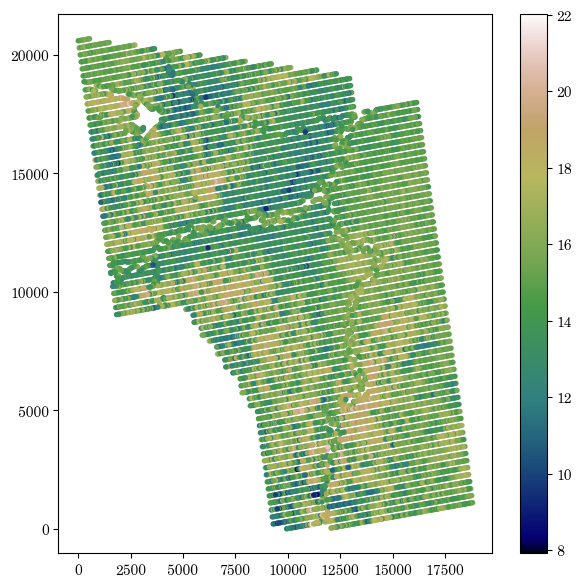

In [7]:
plt.figure(figsize = (7, 7))
plt.scatter(df["X"], df["Y"], c = df["fact_freq_pv_si"], cmap = "gist_earth", s = 8)
plt.colorbar()

In [8]:
"""
убрать выбросы
нормировка
построитть матрицу корреляции
спроецировать из 14-мерного пространство и 3-мерное и 2-мерное и посмотреть, как выделяются области
"""


'\nубрать выбросы\nнормировка\nпостроитть матрицу корреляции\nспроецировать из 14-мерного пространство и 3-мерное и 2-мерное и посмотреть, как выделяются области\n'

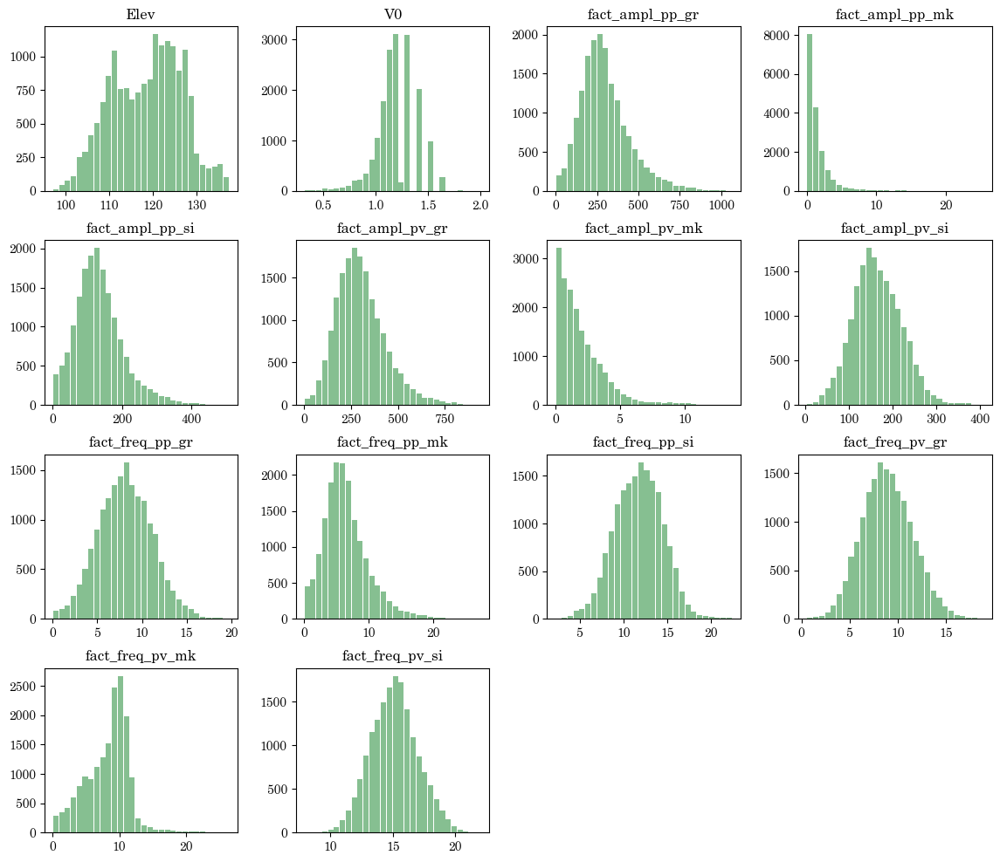

In [9]:
df.iloc[:, 2:].hist(bins = 30, grid=False, figsize=(14,12), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

# Outliers filtering (3σ)

In [10]:
df_filtered = df.copy()

#3σ
for i in range(3, 16):
    indices_to_drop = np.where(zscore(df_filtered.iloc[:, i]) > 3)[0]
    df_filtered = df_filtered.drop(indices_to_drop, axis=0).reset_index(drop=True)

#nan
nan_columns = df_filtered.isna().any()
for i in range(2, df_filtered.shape[1]):
    if nan_columns[i]:
        df_filtered.fillna(df_filtered[df_filtered.columns[i]].mean(), inplace=True)

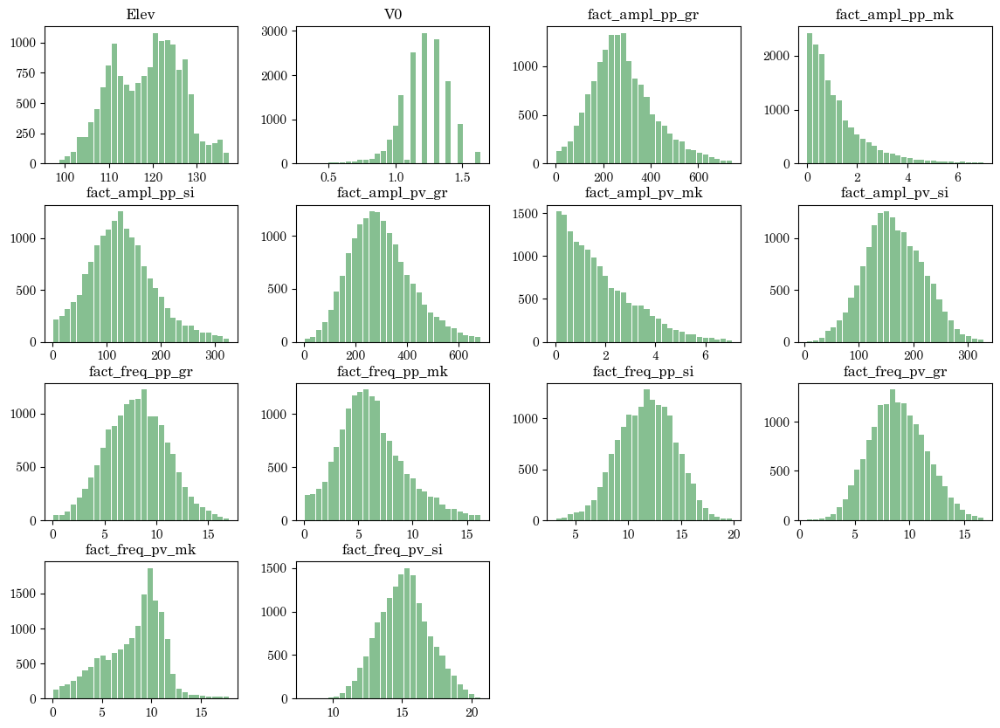

In [11]:
df_filtered.iloc[:, 2:].hist(bins = 30, grid=False, figsize=(14, 10), color='#86bf91', zorder=2, rwidth=0.9)
plt.show()

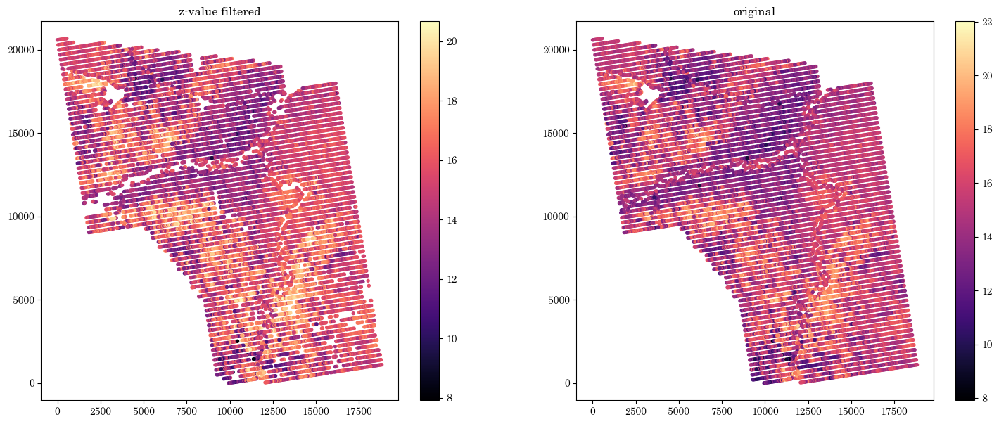

In [12]:
plt.figure(figsize = (18, 7))

plt.subplot(1, 2, 1)
plt.title("z-value filtered")
plt.scatter(df_filtered["X"], df_filtered["Y"], c = df_filtered["fact_freq_pv_si"], cmap = "magma", s = 8)
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("original")
plt.scatter(df["X"], df["Y"], c = df["fact_freq_pv_si"], cmap = "magma", s = 8)
plt.colorbar()

plt.show()

# Normalization

In [13]:
normalized_attributes = df_filtered.iloc[:, 3:]
normalized_attributes = normalized_attributes.apply(lambda x: x/x.max(), axis = 0)

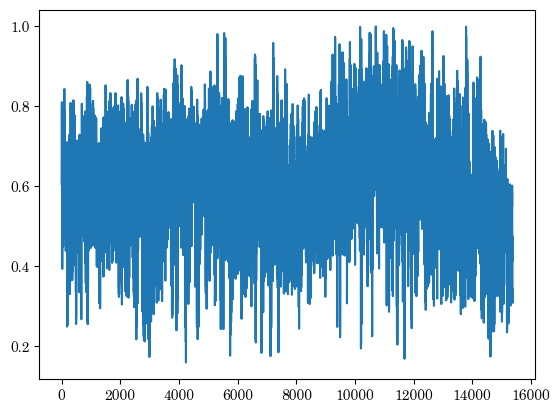

In [14]:
plt.plot(normalized_attributes.iloc[:, 9])

# Defining attributes (R > 0.5)

<Axes: title={'center': 'Attrubutes with Pearson coef. > 0.5'}>

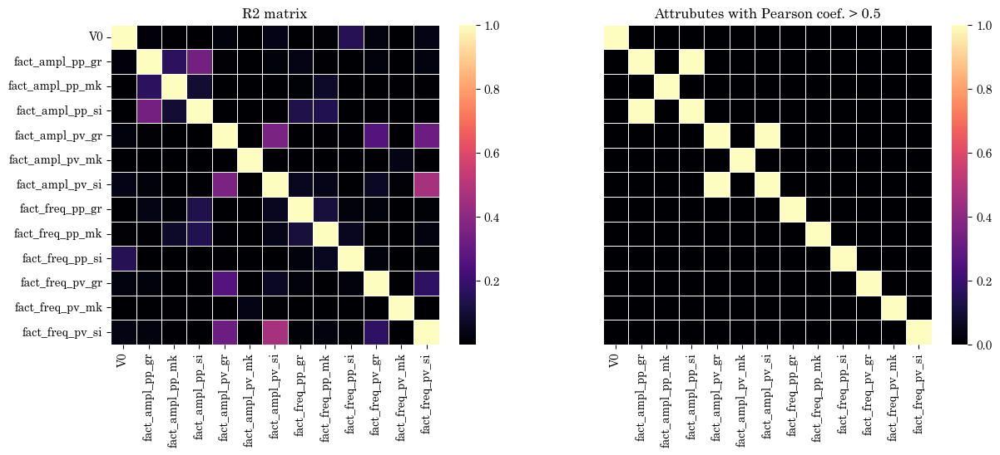

In [15]:
corr = normalized_attributes.corr()

plt.figure(figsize = (14, 5))
# corr.style.background_gradient(cmap='magma')
plt.subplot(121)
plt.title("R2 matrix")
sns.heatmap(corr*corr, annot = False, linewidths = 0.5, cmap = "magma")

plt.subplot(122)
plt.title("Attrubutes with Pearson coef. > 0.5")
sns.heatmap(corr > 0.5, annot = False, cmap = "magma", linewidths = 0.5, yticklabels=False)

In [16]:
# это типо под следующее задание разделял, но суть в том, что убираю атрибуты с кореляцией > 0.5

Y = normalized_attributes.get(["fact_ampl_pp_gr", "fact_ampl_pv_si", "fact_ampl_pv_gr"])
X = normalized_attributes.drop(["fact_ampl_pp_gr","fact_ampl_pv_si", "fact_ampl_pv_gr"], axis = 1)

# PCA

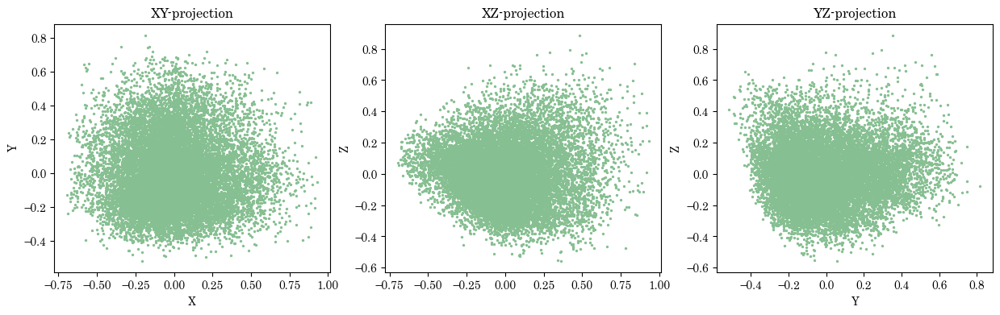

In [17]:
projection_3 = PCA(n_components=3).fit_transform(X)

projection_2 = PCA(n_components=2).fit_transform(X)


plt.figure(figsize = (15, 4))

plt.subplot(131)
plt.scatter(projection_3[:, 0], projection_3[:, 1], c = "#86bf91", s = 2)
plt.title("XY-projection")
plt.xlabel("X")
plt.ylabel("Y")

plt.subplot(132)
plt.scatter(projection_3[:, 0], projection_3[:, 2], c = "#86bf91", s = 2)
plt.title("XZ-projection")
plt.ylabel("Z")

plt.subplot(133)
plt.scatter(projection_3[:, 1], projection_3[:, 2], c = "#86bf91", s = 2)
plt.title("YZ-projection")
plt.xlabel("Y")
plt.ylabel("Z")

plt.show()

<font size = 3> Ничего не выделяется

In [18]:
fig = go.Figure()



fig.add_trace(go.Scatter3d(
    x= np.ones_like(projection_3[:, 0]), 
    y=projection_3[:, 1], 
    z=projection_3[:, 2], 
    mode='markers',
    marker=dict(
            size=3,
            color="lightblue",            
            opacity=0.1
        ),
    name="X_porjection"
))

fig.add_trace(go.Scatter3d(
    x=projection_3[:, 0], 
    y=np.ones_like(projection_3[:, 1]), 
    z=projection_3[:, 2], 
    mode='markers',
    marker=dict(
            size=3,
            color="lightblue",            
            opacity=0.1
        )
    ,
    name="Y_porjection"
))

fig.add_trace(go.Scatter3d(
    x=projection_3[:, 0], 
    y=projection_3[:, 1], 
    z=-np.ones_like(projection_3[:, 2]), 
    mode='markers',
    marker=dict(
            size=3,
            color="lightblue",            
            opacity=0.1
        ),
    name="Z_porjection"
    
))

fig.add_trace(go.Scatter3d(
    x=projection_3[:, 0], 
    y=projection_3[:, 1], 
    z=projection_3[:, 2], 
    mode='markers',
    marker=dict(
            size=2,
            color="crimson",            
            opacity=0.8
        ),
    name="3D"
))

fig.show()

# UMAP

In [19]:
n_neighbors = np.arange(2, 50, 5)

min_dists = np.linspace(0, 1, len(n_neighbors))

projection_3_umap = np.zeros((n_neighbors.shape[0], min_dists.shape[0], 15375, 3))
projection_2_umap = np.zeros((n_neighbors.shape[0], min_dists.shape[0], 15375, 2))

for i, n in enumerate(n_neighbors):
    for j, min_dis in enumerate(min_dists):
        projection_3_umap[i, j] = umap.UMAP(n_components=3, n_neighbors=n, min_dist=min_dis).fit_transform(X)
        projection_2_umap[i, j] = umap.UMAP(n_components=2, n_neighbors=n, min_dist=min_dis).fit_transform(X)

KeyboardInterrupt: 

In [ ]:
def plot_umap(N, dist):
    fig = plt.figure(figsize=(14,4))

    fig.add_subplot(131)
    plt.scatter(projection_3_umap[N, dist, :, 0], projection_3_umap[N, dist, :, 1], c = "purple", s = 1)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title('UMAP result XY')

    fig.add_subplot(132)
    plt.scatter(projection_3_umap[N, dist, :, 0], projection_3_umap[N, dist, :, 2], c = "brown", s = 1)
    plt.xlabel("X")
    plt.ylabel("Z")
    plt.title('UMAP result XZ')
    
    fig.add_subplot(133)
    plt.scatter(projection_3_umap[N, dist, :, 1], projection_3_umap[N, dist, :, 2], c = "palegreen", s = 1)
    plt.xlabel("X")
    plt.ylabel("Z")
    plt.title('UMAP result YZ')

    fig.suptitle('UMAP: n_neighbors=%d; min_dists=%.2f' % (n_neighbors[N], min_dists[dist]))

    
    fig.tight_layout()
    plt.show()

<font size = 3> Считалось ультра долго, поэтому параметры сильно не перебирал. Отчетливо ничего не выделяется, только выбросы в некоторых областях

In [ ]:
neighbors_slider = ipw.IntSlider(min=1, max=len(n_neighbors) - 1, step=1)
min_dists_slider = ipw.IntSlider(min=1, max=len(min_dists) - 1, step=1)

ipw.interact(plot_umap, N = neighbors_slider, dist= min_dists_slider)

In [ ]:
fig = go.Figure()


fig.add_trace(go.Scatter3d(
    x=projection_3_umap[4, 2, :, 0], 
    y=projection_3_umap[4, 2, :, 1], 
    z=projection_3_umap[4, 2, :, 2], 
    mode='markers',
    marker=dict(
            size=1.5,
            color="crimson",            
            opacity=0.8
        ),
    name="3D"
))

fig.show()